In [1]:
from matplotlib.pyplot import *
import numpy as np
import h5py
from Data_Core.experiment import *
from Data_Core.digital_twin import *
from tqdm import tqdm
#from src.algorithms import *
#import torch
import sklearn
%load_ext autoreload
import scipy

In [2]:
#find_index = lambda wavelenghts, w : np.argmin(np.abs(wavelenghts - w))

def find_index(wavelenghts,w):
    return np.argmin(np.abs(wavelenghts - w))

In [3]:
def read_data_map(file):
    hf = h5py.File(file, 'r')
    spectrums = np.array(hf.get('intensities'))
    positions = np.array(hf.get('position'))
    wavelengths = np.array(hf.get('wavelengths'))
    positions = np.delete(positions, 0, 0)
    spectrums = np.delete(spectrums, 0, 0)
    x = positions[:, 0]
    y = positions[:, 1]
    xy = np.lexsort((y, x))

    hf.close()
    return spectrums[xy], wavelengths, positions

In [4]:
filename = "340.h5"
#filename = "2023811_1451.h5"
spectrum, wavelengths, positions = read_data_map(filename)

In [5]:
spectrum = spectrum.reshape(80, 80, -1)
pro_data = 1*spectrum

In [6]:
pro_data_norm=pro_data.copy()
for i in range(0,pro_data.shape[0]):
    for j in range(0,pro_data.shape[1]):
        spec = 1 * pro_data[i,j, :]
        sum_spec=np.sum(spec)
        pro_data_norm[i,j,:]=spec/sum_spec

In [7]:


mask = pro_data_norm[:, :, :].reshape(pro_data.shape[0]*pro_data.shape[1], -1)

# threshold = 120
# threshold2 = 0.01

# # Scaled to max value for each wavenumber
# # masks = np.array([mask[:, i]*(mask[:, i] > threshold)/np.max(mask[:, i]) for i in range(mask.shape[-1])])
# masks = np.array([np.array((mask[:, i]/np.max(mask[:, i]))*((mask[:, i] > threshold)) > threshold2, dtype = int) for i in range(mask.shape[-1])])

In [8]:
threshold = 1.27e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in range(mask_offset.shape[-1])])

In [9]:
maxi=mask_t.max()
mini=mask_t.min()

mask_min_max = np.array([(mask_t[i, :] - mini)/(maxi -mini) for i in tqdm(range(mask_t.shape[0]))])

100%|█████████████████████████████████████████████████████████████████████████| 14336/14336 [00:01<00:00, 10333.87it/s]


In [10]:
def read_ref(mineral):
    df = pd.read_csv(mineral + '_raman.txt',header=13,names=['wavenumber','int'],skipfooter=4,engine='python' )
    return np.array(df['wavenumber']),np.array(df['int'])

In [11]:
entropy_masks=mask_min_max*255

## Cálculo da entropia

In [12]:
def entropy_calc(map_gr,lim=255):
    import cv2
    from scipy.stats import entropy

    #image

    _bins = 200

    hist, _ = np.histogram(map_gr, bins=_bins, range=(0, lim))

    prob_dist = hist / hist.sum()
    image_entropy = entropy(prob_dist, base=2)
    return image_entropy

In [13]:
offset_l = 0
offset_m = -1

minerals = {
    
    'Li':[610.22],
    'Na':[588.99],
    'Al':[309.27],
    'Si':[288.13],
    'K':[766.5]}


wl = [670.76, 588.99, 309.27, 288.16, 766.5]
mineral_list = list(minerals.keys())

find_index = lambda wavelenghts,w : np.argmin(np.abs(wavelengths-w))

significant_w=[]
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    significant_w.append(wn)

In [14]:
image_entropy=[]
for i in range(mask_t.shape[0]):
    map_gr=entropy_masks[i]
    image_entropy.append(entropy_calc(map_gr))


(0.0, 500.0)

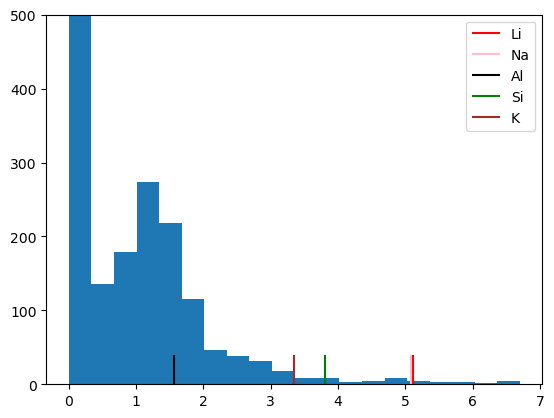

In [15]:
plt.hist(image_entropy,bins=20)
colors=['red','pink','black','green','brown']
for i in range(len(significant_w)):
    plt.vlines(image_entropy[significant_w[i]],0,40,color=colors[i],label=mineral_list[i])
    
plt.legend()
plt.ylim([0,500])

In [16]:
relevant_entropies=[]

for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
max_en=np.max(relevant_entropies)+0.2
min_en=np.min(relevant_entropies)-0.2
#min_en=5.2
#max_en=6.3

new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]<=max_en:
        new_maps_cut.append(entropy_masks[i,:])
        
new_maps_cut=np.array(new_maps_cut)


C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


Text(0.5, 1.0, 'Al')

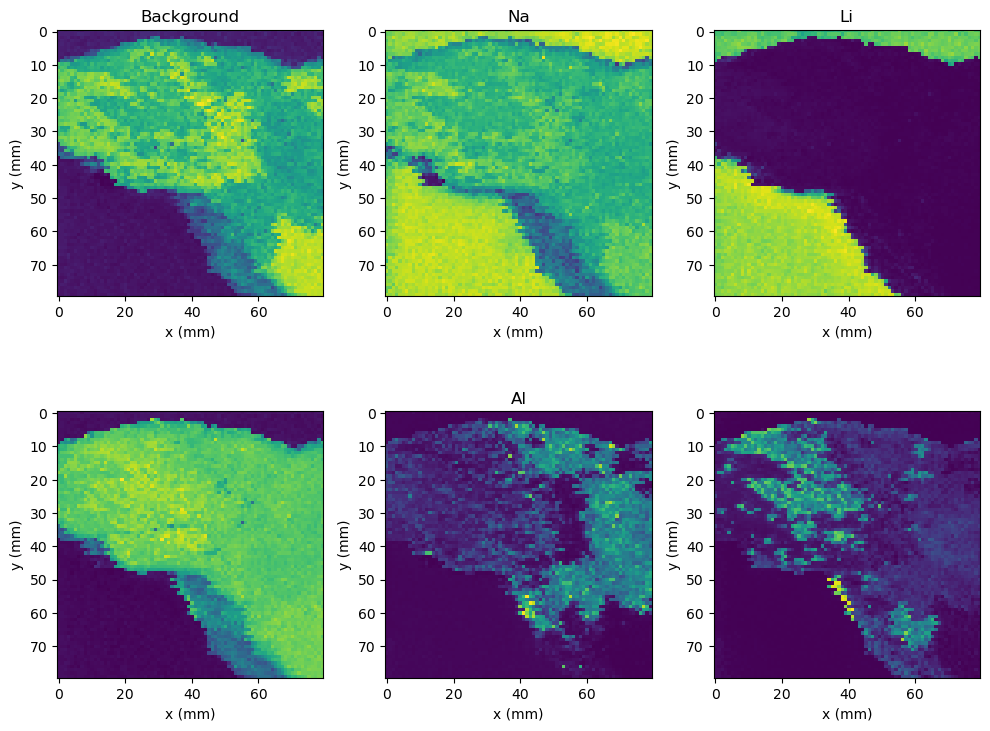

In [17]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6,random_state=0)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]).T, interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()

axs=ax[0,0]
axs.set_title('Background')
axs=ax[0,1]
axs.set_title('Na')
axs=ax[0,2]
axs.set_title('Li')
axs=ax[1,1]
axs.set_title('Al')

## Outros dados

100%|█████████████████████████████████████████████████████████████████████████| 16384/16384 [00:00<00:00, 27950.76it/s]


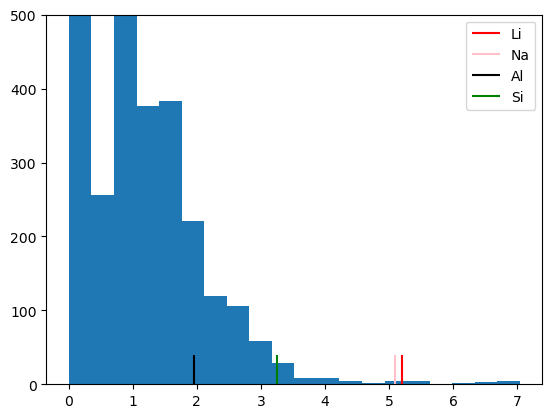

In [107]:
filename = "PetalideEspodumena_ADG-2-40-8_map"
def read_data_map(file):
 
    hf = h5py.File(file + '.h5', 'r')
    sample = file.split("\\")[-1]
    keys = [key for key in hf.keys()]
    sample = keys[0].split(' ')[-1]
 
    spectrums = np.array([np.ndarray.flatten(np.array(list(hf['Sample_ID: ' + sample]['Spot_' + str(i)]['Shot_0']['Pro']))) for i in range(0,
                                                        len(list(hf['Sample_ID: ' + sample])))])
    positions = np.array([np.ndarray.flatten(np.array(list(hf['Sample_ID: ' + sample]['Spot_' + str(i)]['position']))) for i in range(0,
                                                        len(list(hf['Sample_ID: ' + sample])))])
    wavelengths = np.array(hf['System properties']['wavelengths'])
 
   
    unique_x = np.unique(positions[:,0])
    unique_y = np.unique(positions[:,1])
   
    nx = len(unique_x)
    ny = len(unique_y)
    indexes = np.lexsort((positions[:, 0],positions[:, 1]))
    spectrums = spectrums[indexes, :]
    spectrums = np.array(spectrums.reshape((ny, nx, -1)))
    # print(spectrums.shape)
    positions = np.array(positions[indexes])
   
    hf.close()
    return spectrums, wavelengths, positions, unique_x, unique_y
spectrum, wavelengths, positions,unique_x,unique_y = read_data_map(filename)

pro_data = 1*spectrum

pro_data_norm=pro_data.copy()
for i in range(0,pro_data.shape[0]):
    for j in range(0,pro_data.shape[1]):
        spec = 1 * pro_data[i,j, :]
        sum_spec=np.sum(spec)
        pro_data_norm[i,j,:]=spec/sum_spec
mask = pro_data_norm[:, :, :].reshape(pro_data.shape[0]*pro_data.shape[1], -1)
       
threshold = 1.27e-9

mask_offset = np.array(mask)
mask_t = np.array([(mask_offset[:, i])*((mask_offset[:, i] > threshold)) for i in tqdm(range(mask_offset.shape[-1]))])

maxi=mask_t.max()
mini=mask_t.min()

mask_min_max = np.array([(mask_t[i, :] - mini)/(maxi -mini) for i in tqdm(range(mask_t.shape[0]))])
entropy_masks=mask_min_max*255

offset_l = 0
offset_m = -1

minerals = {
    
    'Li':[610.22],
    'Na':[588.99],
    'Al':[309.27],
    'Si':[288.13]}


wl = [670.76, 588.99, 309.27, 288.16, 766.5]
mineral_list = list(minerals.keys())

find_index = lambda wavelenghts,w : np.argmin(np.abs(wavelengths-w))

significant_w=[]
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    significant_w.append(wn)

image_entropy=[]
for i in range(mask_t.shape[0]):
    map_gr=entropy_masks[i]
    image_entropy.append(entropy_calc(map_gr))
    
plt.hist(image_entropy,bins=20)
colors=['red','pink','black','green','brown']
for i in range(len(significant_w)):
    plt.vlines(image_entropy[significant_w[i]],0,40,color=colors[i],label=mineral_list[i])
    
plt.legend()
plt.ylim([0,500])


relevant_entropies=[]

for i in significant_w:
    relevant_entropies.append(image_entropy[i])
    
#max_en=np.max(relevant_entropies)+0.2
min_en=np.min(relevant_entropies)-0.2
#min_en=5.2
#max_en=6.3

new_maps_cut=[]
for i in range(entropy_masks.shape[0]):
    if min_en<=image_entropy[i]:
        new_maps_cut.append(entropy_masks[i,:])
        
new_maps_cut=np.array(new_maps_cut)

C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Joana\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


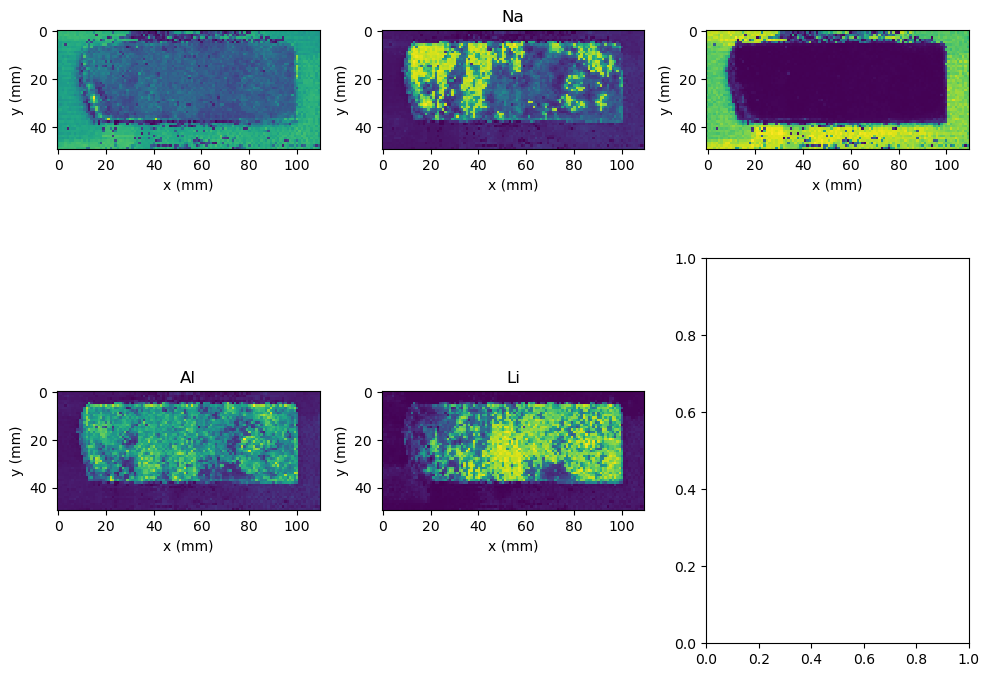

In [108]:
kmeans = sklearn.cluster.KMeans(n_clusters = 5,random_state=0)
a=kmeans.fit_predict(new_maps_cut)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

axs=ax[0,1]
axs.set_title('Na')
axs=ax[1,0]
axs.set_title('Al')
axs=ax[1,1]
axs.set_title('Li')
fig.tight_layout()




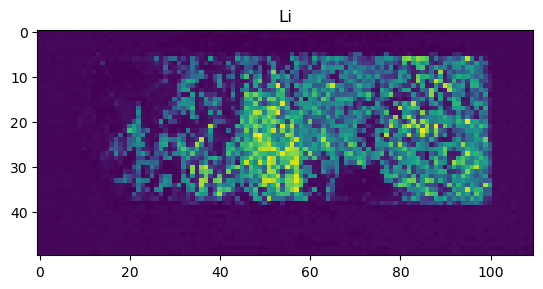

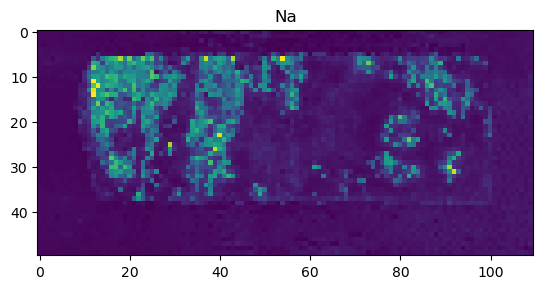

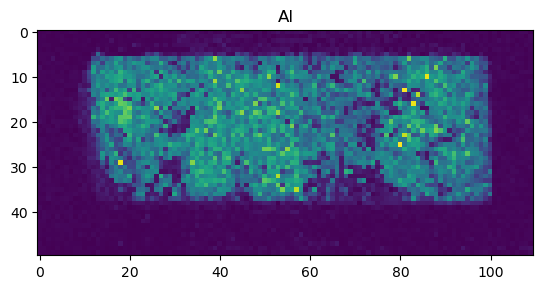

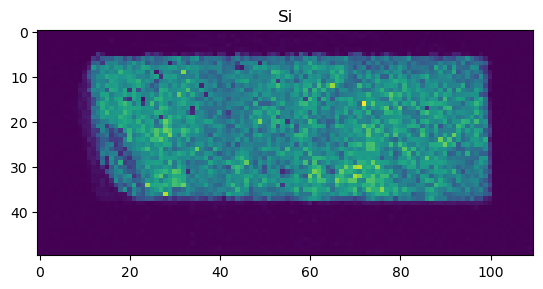

In [109]:
#mapas dos elementos
for i,mineral in enumerate(mineral_list):
    wn=find_index(wavelengths,minerals[mineral][0])
    plt.imshow(entropy_masks[wn,:].reshape(spectrum.shape[0],spectrum.shape[1]))
    plt.title(mineral)
    plt.show()

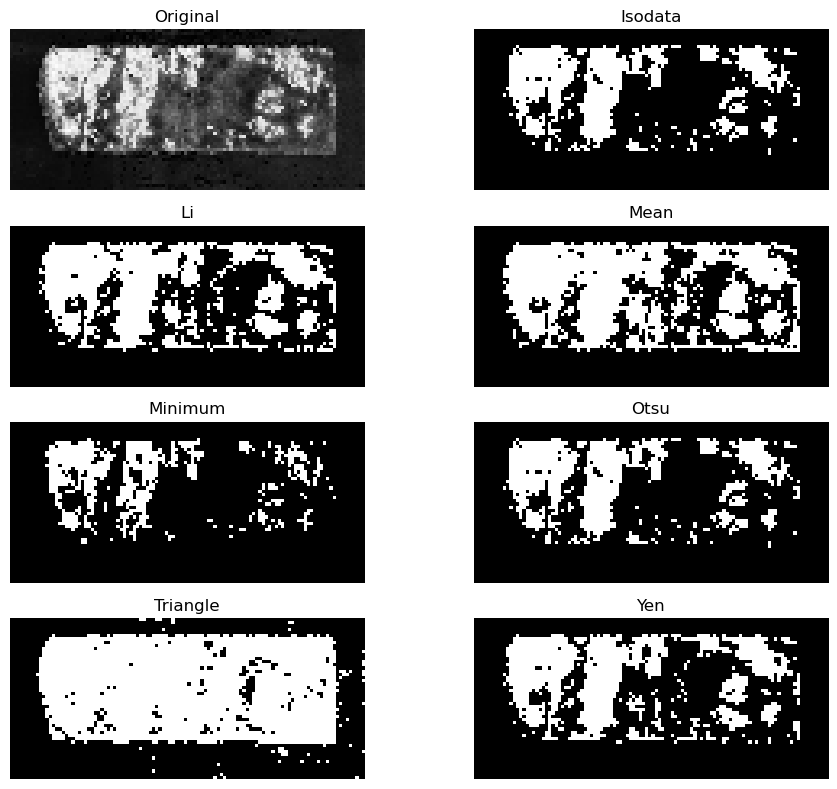

In [110]:
from skimage.filters import try_all_threshold
fig, ax = try_all_threshold(clusters_c[1].reshape(spectrum.shape[0],spectrum.shape[1]), figsize=(10, 8), verbose=False)
plt.show()

Área de cobertura 88.0 %


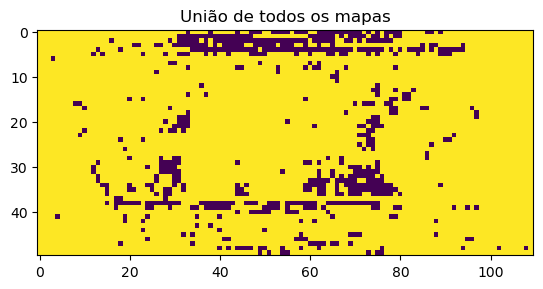

In [111]:
from skimage.filters import threshold_minimum
import cv2
thresholds=np.array([threshold_minimum(clusters_c[i]) for i in range(clusters_c.shape[0])])

cluster_thres=[]
for i in range(clusters_c.shape[0]):
    c_mask=np.zeros(clusters_c.shape[1])
    for j in range(clusters_c.shape[1]):
        if clusters_c[i][j]>thresholds[i]:
            c_mask[j]=1
    cluster_thres.append(c_mask.reshape(spectrum.shape[0],spectrum.shape[1]))
    
    
img_or = cluster_thres[0]

for img in cluster_thres[1:]:
    img_or = cv2.bitwise_or(img_or, img)
    
imshow(img_or)
plt.title('União de todos os mapas')
#uniao de todos os mapas
cut_int=img_or.copy()
print('Área de cobertura',round(sum(cut_int)/(cut_int.shape[0]*cut_int.shape[1]),2)*100, '%')

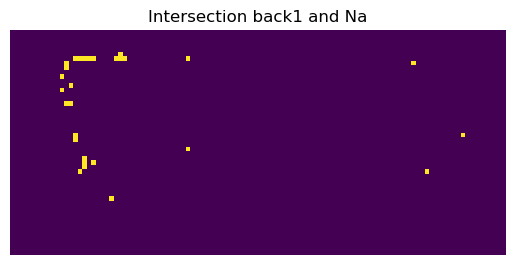

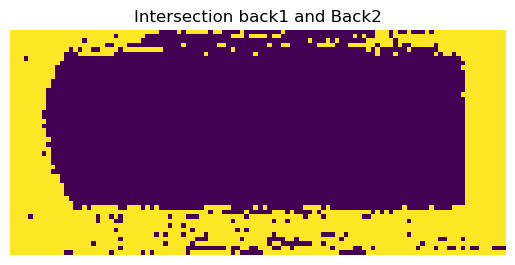

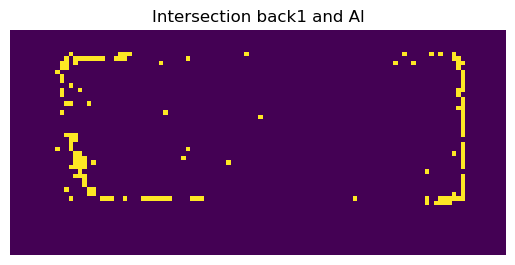

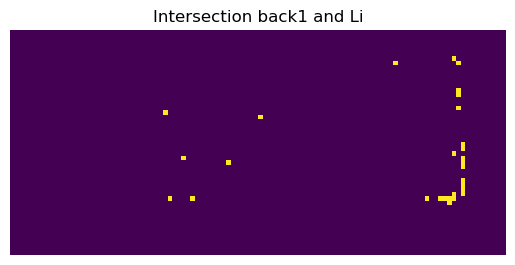

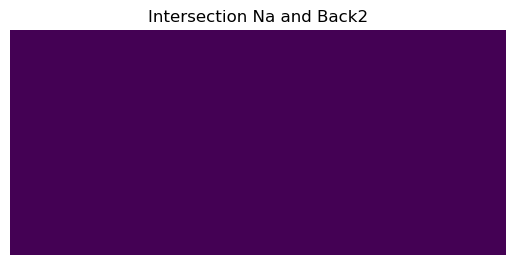

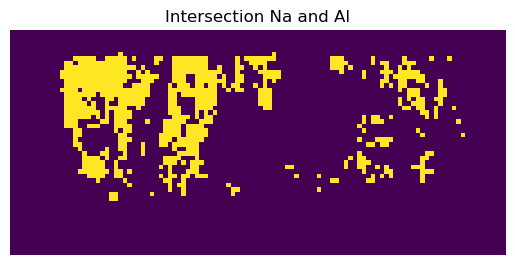

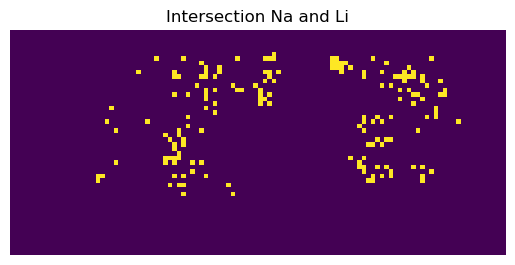

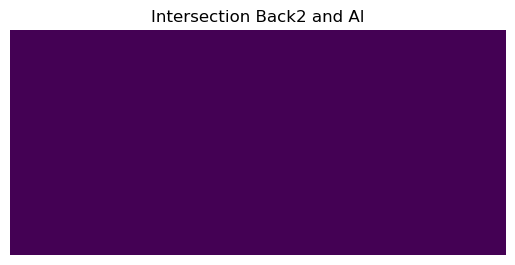

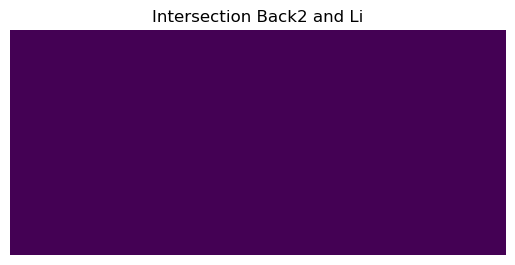

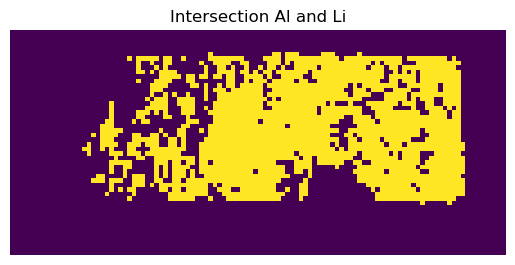

<Figure size 640x480 with 0 Axes>

In [112]:
import cv2
import matplotlib.pyplot as plt

# Assuming cluster_thres is a NumPy array containing your images

# Create a subplot with enough space for all the intersections
num_images = np.array(cluster_thres).shape[0]
num_subplots = num_images * (num_images - 1) // 2
minerals_order=['back1','Na','Back2','Al','Li']

subplot_index = 0

for i in range(num_images):
    for j in range(i + 1, num_images):
        # Calculate the intersection
        img_and = cv2.bitwise_and(cluster_thres[i], cluster_thres[j])
        
        plt.imshow(img_and)
        plt.title(f'Intersection {minerals_order[i]} and {minerals_order[j]}')
        plt.axis('off')
        plt.show()
        
        # Increment subplot index
        subplot_index += 1

# Adjust layout for better visualization
plt.tight_layout()
plt.show()




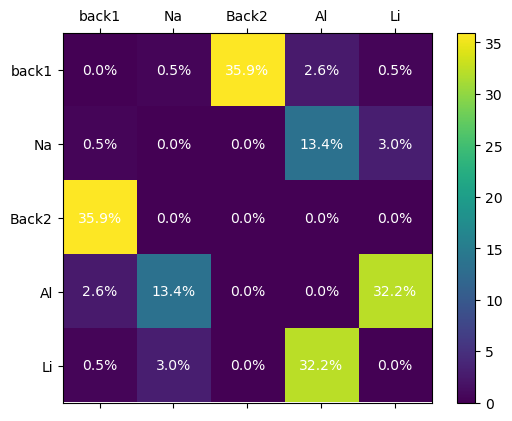

In [113]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

num_images = np.array(cluster_thres).shape[0]
minerals_order=['back1','Na','Back2','Al','Li']

confusion_matrix = np.zeros((num_images, num_images))

for i in range(num_images):
    for j in range(i + 1, num_images):
        img_and = cv2.bitwise_and(cluster_thres[i], cluster_thres[j])
        
        overlap_value = np.sum(img_and) /(img_and.shape[0]*img_and.shape[1])*100

        confusion_matrix[i, j] = overlap_value
        confusion_matrix[j, i] = overlap_value

fig, ax = plt.subplots()
cax = ax.matshow(confusion_matrix)

ax.set_xticks(range(num_images))
ax.set_yticks(range(num_images))
ax.set_xticklabels(minerals_order)
ax.set_yticklabels(minerals_order)
for i in range(num_images):
    for j in range(num_images):
        plt.text(j, i, f'{confusion_matrix[i, j]:.1f}'+'%', ha='center', va='center', color='w')

fig.colorbar(cax)
plt.show()

In [114]:
from itertools import combinations
 
def generate_combinations(n, j):
    indices = list(range(n))
    combo_list = list(combinations(indices, j))
    combo_list_as_lists = [list(combo) for combo in combo_list]
   
    return combo_list_as_lists
 
n = 5  
j = 5
combinations_result = generate_combinations(n, j)

n = 5
j = 4 
combinations_result = generate_combinations(n, j)
print(combinations_result)

[[0, 1, 2, 3], [0, 1, 2, 4], [0, 1, 3, 4], [0, 2, 3, 4], [1, 2, 3, 4]]


In [115]:
#interseção de todos
def intersection_maps(maps):
    img_and = maps[0]

    for img in maps[1:]:
        img_and = cv2.bitwise_and(img_and, img)
    return img_and

def union_maps(maps):
    img_or = maps[0]
    for img in maps[1:]:
        img_or = cv2.bitwise_or(img_or, img)
    return img_or


int_todos=intersection_maps(cluster_thres)
n = 5
j = 4 
combinations_result = generate_combinations(n, j) #5C4
new_base=[]
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=intersection_maps([intersection_maps(maps),1-int_todos])
    int_comb.append(int_s)
I1=union_maps(int_comb)
n = 5
j = 3 
combinations_result = generate_combinations(n, j) #5C3
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=intersection_maps([intersection_maps(maps),1-I1])
    int_comb.append(int_s)
I2=union_maps(int_comb)

n = 5
j = 2
combinations_result = generate_combinations(n, j)  #5C2
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=intersection_maps([intersection_maps(maps),1-I2])
    int_comb.append(int_s)
I3=union_maps(int_comb)


int_comb=[]
for i in range(np.array(cluster_thres).shape[0]):
    int_s=intersection_maps([cluster_thres[i],1-I3])
    int_comb.append(int_s)
I4=union_maps(int_comb) #5C1



Text(0.5, 1.0, 'I$_4$')

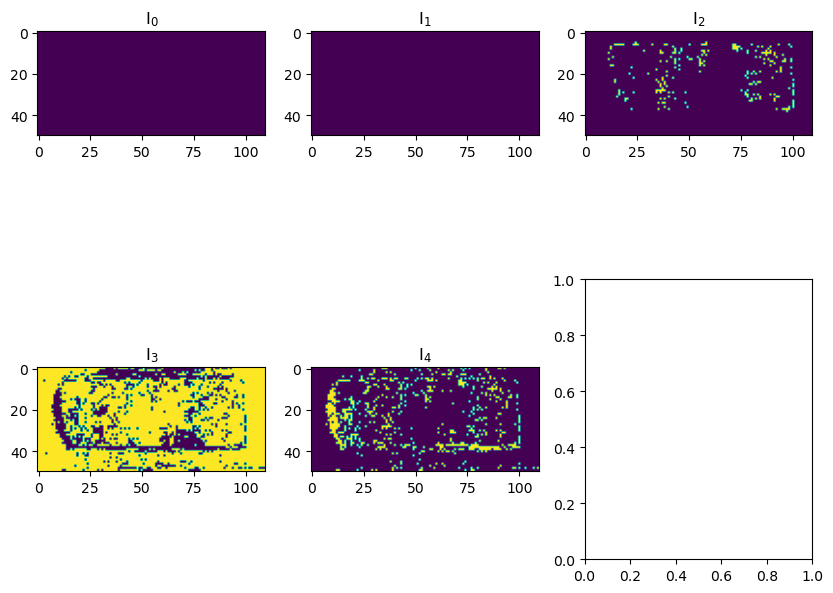

In [116]:
fig,ax=subplots(2,3,figsize=(10,8))
ax[0,0].imshow(int_todos)
ax[0,0].set_title(r'I$_0$')
ax[0,1].imshow(I1)
ax[0,1].set_title(r'I$_1$')
ax[0,2].imshow(I2)
ax[0,2].set_title(r'I$_2$')
ax[1,0].imshow(I3)
ax[1,0].set_title(r'I$_3$')
ax[1,1].imshow(I4)
ax[1,1].set_title(r'I$_4$')

In [117]:
np.dot(I3.flatten(),I4.flatten())

0.0

In [118]:
np.dot(I3.flatten(),I2.flatten())

0.0

In [120]:
np.dot(I2.flatten(),I4.flatten())

223.0

Text(0.5, 1.0, 'I$_4$')

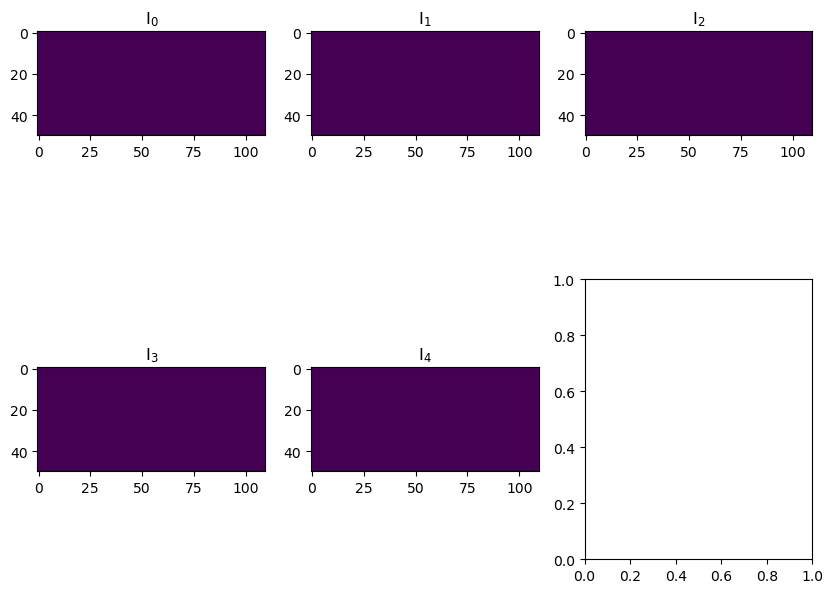

In [31]:
#interseção de todos
def intersection_maps(maps):
    img_and = maps[0]

    for img in maps[1:]:
        img_and = cv2.bitwise_and(img_and, img)
    return img_and

def union_maps(maps):
    img_or = maps[0]
    for img in maps[1:]:
        img_or = cv2.bitwise_or(img_or, img)
    return img_or


int_todos=intersection_maps(cluster_thres)
n = 5
j = 4 
combinations_result = generate_combinations(n, j) #5C4
new_base=[]
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=intersection_maps(maps)-int_todos
    int_comb.append(int_s)
I1=intersection_maps(int_comb)
n = 5
j = 3 
combinations_result = generate_combinations(n, j) #5C3
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=intersection_maps(maps)-I1
    int_comb.append(int_s)
I2=intersection_maps(int_comb)

n = 5
j = 2
combinations_result = generate_combinations(n, j)  #5C2
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=intersection_maps(maps)-I2
    int_comb.append(int_s)
I3=intersection_maps(int_comb)


I4=intersection_maps(cluster_thres-I3) #5C1

fig,ax=subplots(2,3,figsize=(10,8))
ax[0,0].imshow(int_todos)
ax[0,0].set_title(r'I$_0$')
ax[0,1].imshow(I1)
ax[0,1].set_title(r'I$_1$')
ax[0,2].imshow(I2)
ax[0,2].set_title(r'I$_2$')
ax[1,0].imshow(I3)
ax[1,0].set_title(r'I$_3$')
ax[1,1].imshow(I4)
ax[1,1].set_title(r'I$_4$')

Text(0.5, 1.0, 'I$_4$')

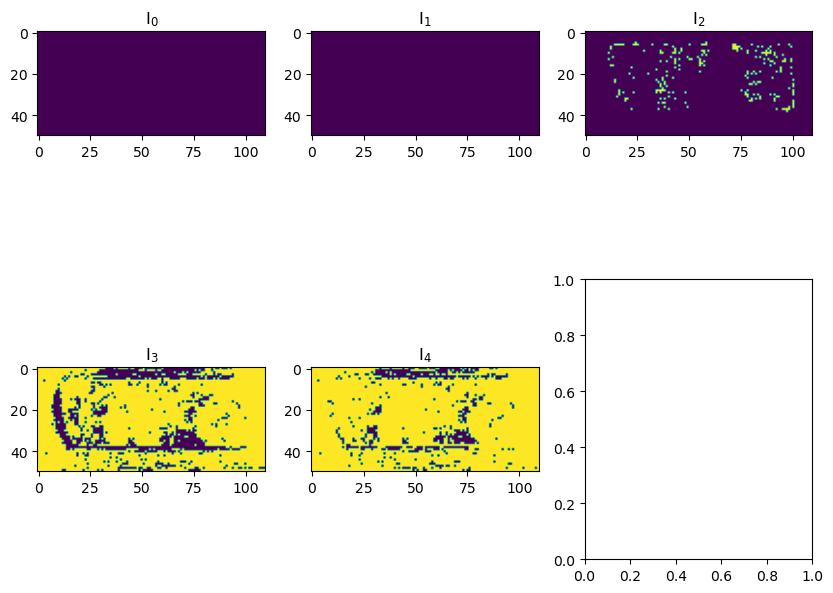

In [32]:
#interseção de todos
def intersection_maps(maps):
    img_and = maps[0]

    for img in maps[1:]:
        img_and = cv2.bitwise_and(img_and, img)
    return img_and

def union_maps(maps):
    img_or = maps[0]
    for img in maps[1:]:
        img_or = cv2.bitwise_or(img_or, img)
    return img_or


int_todos=intersection_maps(cluster_thres)
n = 5
j = 4 
combinations_result = generate_combinations(n, j) #5C4
new_base=[]
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=abs(intersection_maps(maps)-int_todos)
    int_comb.append(int_s)
I1=union_maps(int_comb)
n = 5
j = 3 
combinations_result = generate_combinations(n, j) #5C3
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=abs(intersection_maps(maps)-I1)
    int_comb.append(int_s)
I2=union_maps(int_comb)

n = 5
j = 2
combinations_result = generate_combinations(n, j)  #5C2
int_comb=[]
for i in combinations_result:
    maps=[]
    for j in range(len(combinations_result[0])):
        maps.append(cluster_thres[i[j]])
        
    int_s=abs(intersection_maps(maps)-I2)
    int_comb.append(int_s)
I3=union_maps(int_comb)


I4=union_maps(abs(cluster_thres-I3)) #5C1

fig,ax=subplots(2,3,figsize=(10,8))
ax[0,0].imshow(int_todos)
ax[0,0].set_title(r'I$_0$')
ax[0,1].imshow(I1)
ax[0,1].set_title(r'I$_1$')
ax[0,2].imshow(I2)
ax[0,2].set_title(r'I$_2$')
ax[1,0].imshow(I3)
ax[1,0].set_title(r'I$_3$')
ax[1,1].imshow(I4)
ax[1,1].set_title(r'I$_4$')

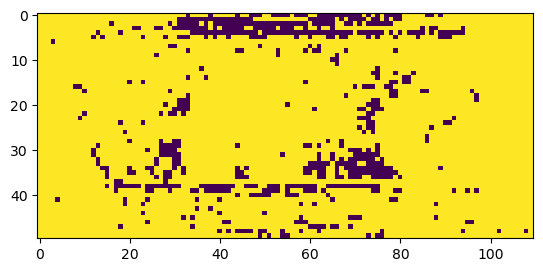

In [33]:
base=[int_todos,I1,I2,I3,I4]
imshow(union_maps(base))

In [35]:
#aplicar threshold aos mapas selecionados com a entropia
from skimage.filters import threshold_otsu
import cv2
thresholds=np.array([threshold_otsu(new_maps_cut[i]) for i in range(new_maps_cut.shape[0])])

maps_thres=[]
for i in range(new_maps_cut.shape[0]):
    c_mask=np.zeros(new_maps_cut.shape[1])
    for j in range(new_maps_cut.shape[1]):
        if new_maps_cut[i][j]>thresholds[i]:
            c_mask[j]=1
    maps_thres.append(c_mask)
maps_thres=np.array(maps_thres)  


In [63]:
def intersection_maps(maps):
    img_and = maps[0]

    for img in maps[1:]:
        img_and = cv2.bitwise_and(img_and, img)
    return img_and
int_all=[]
cluster_thres=np.array(cluster_thres).reshape(clusters_c.shape[0],-1)
for i in range(cluster_thres.shape[0]):
    int_s=[]
    for j in range(new_maps_cut.shape[0]):
        int_s.append(sum(intersection_maps([cluster_thres[i],maps_thres[j]]))/(sum(cluster_thres[i])*sum(maps_thres[j])))
    int_all.append(int_s)
    
int_all=np.array(int_all)

In [64]:
int_all

array([[8.68516370e-06, 9.21690842e-06, 8.09570104e-06, ...,
        8.80903697e-06, 9.79296519e-06, 9.37807763e-06],
       [3.66579180e-04, 3.67597455e-04, 3.65500771e-04, ...,
        3.01153967e-04, 3.01982328e-04, 3.01706882e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.83684263e-06, 4.39796162e-06, 3.97963224e-06],
       [3.36756028e-04, 3.36756028e-04, 3.36296185e-04, ...,
        2.93876155e-04, 2.94081925e-04, 2.94508199e-04],
       [3.65716171e-04, 3.64870096e-04, 3.64177379e-04, ...,
        3.03131927e-04, 3.02472021e-04, 3.03026338e-04]])

In [95]:
contain=np.zeros([int_all.shape[0],int_all.shape[1]])
for i in range(int_all.shape[0]):
    for j in range(int_all.shape[1]):
        if int_all[i][j]>4.4e-4:
            contain[i][j]=1

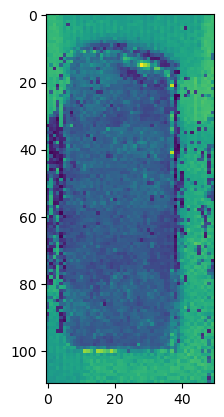

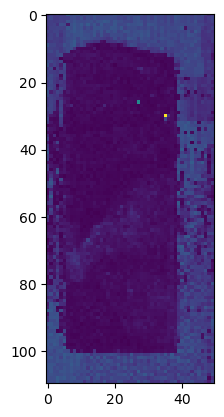

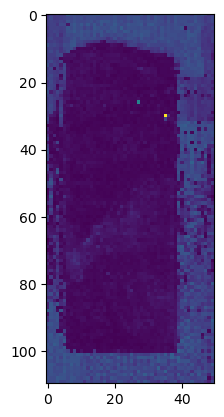

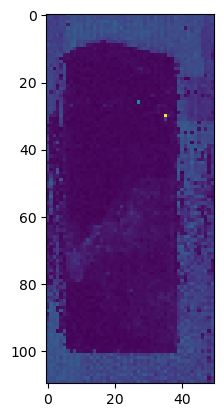

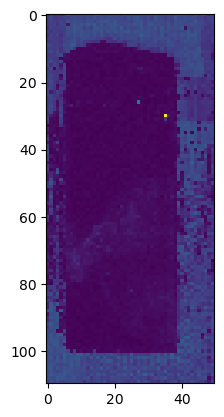

...

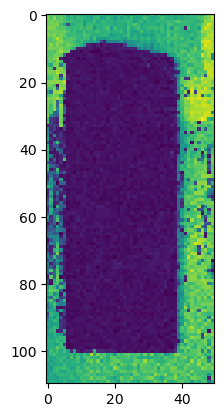

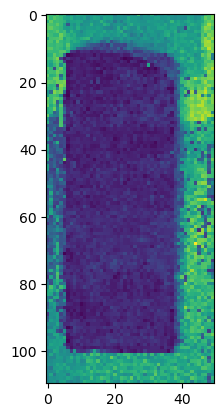

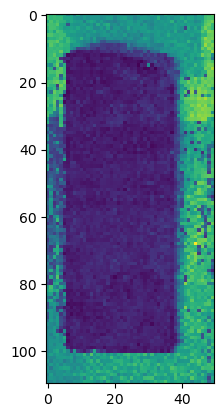

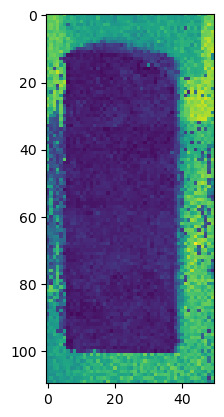

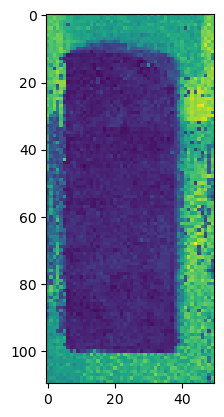

In [96]:
imshow(clusters_c[0].reshape(50,110).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[0][i]==1:
        imshow(new_maps_cut[i].reshape(50,110).T)
        plt.show()

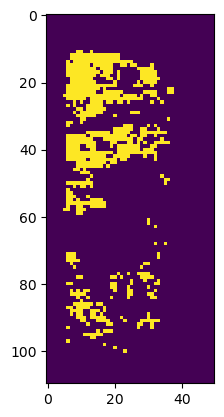

142


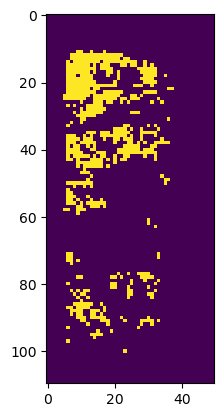

143


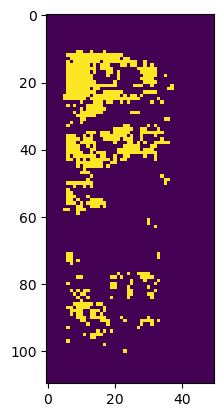

144


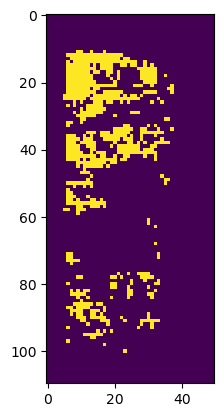

145


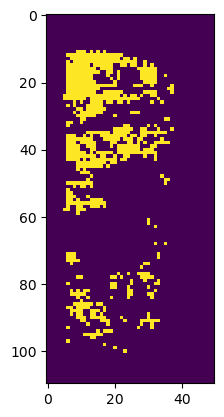

146


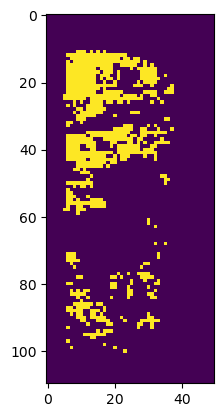

147


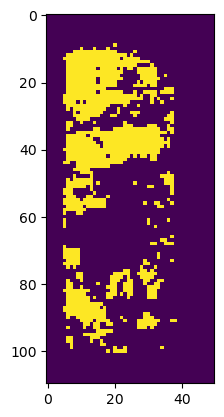

148


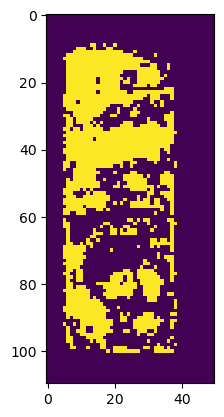

149


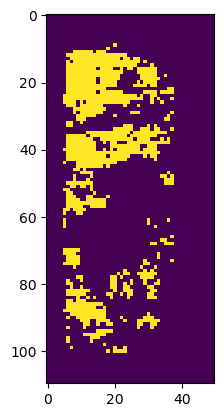

150


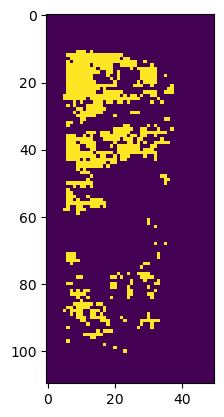

151


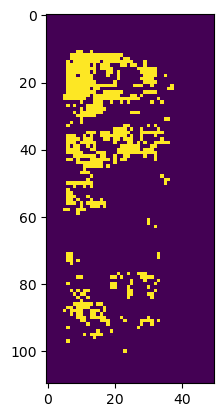

152


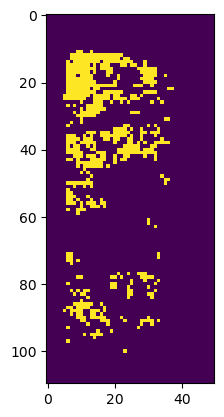

153


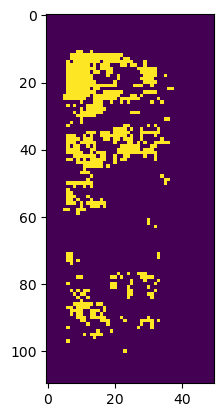

154


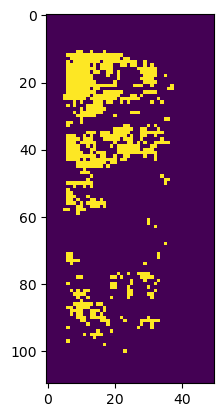

155


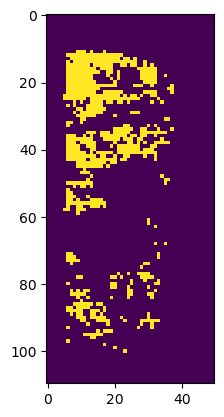

156


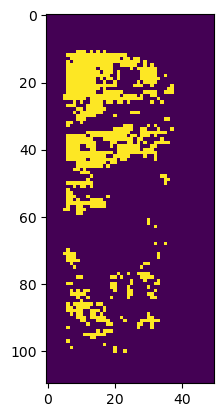

157


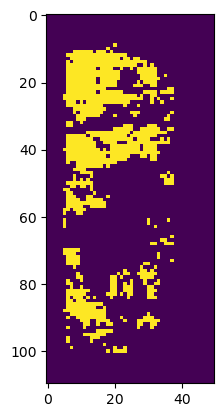

158


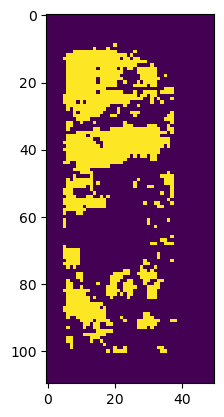

159


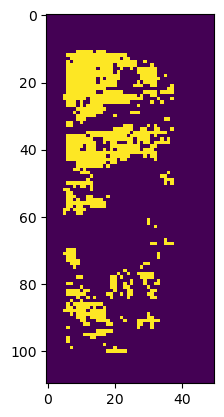

160


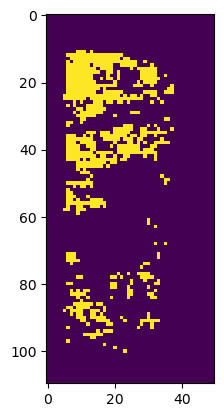

161


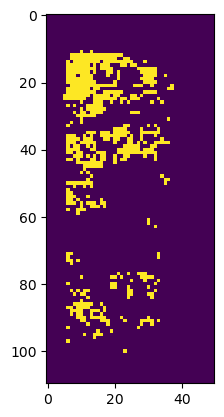

162


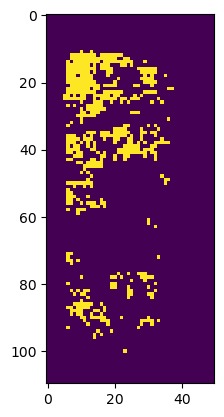

163


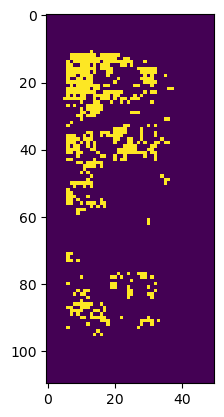

516


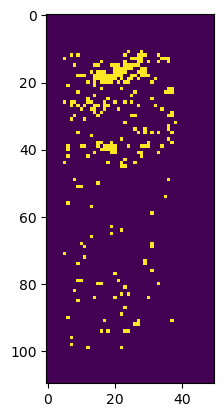

517


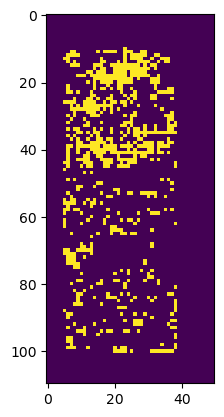

518


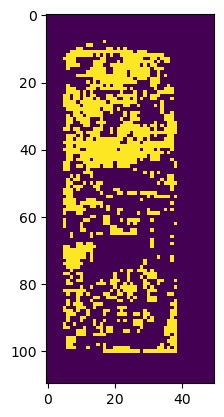

519


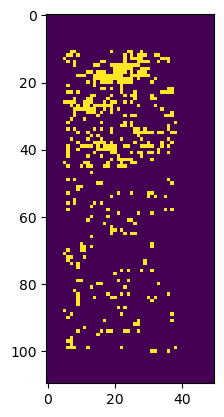

520


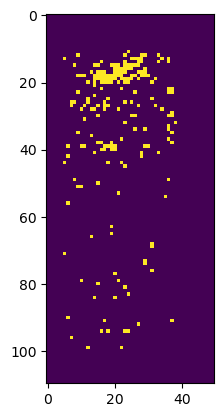

521


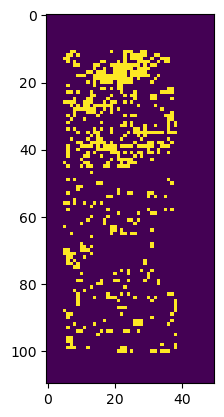

522


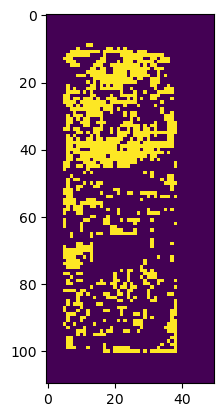

523


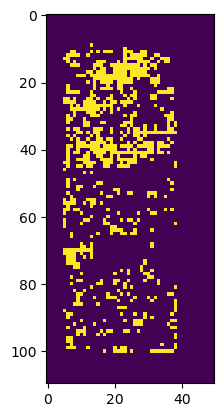

533


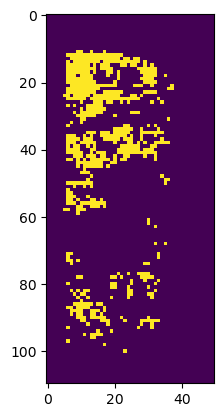

534


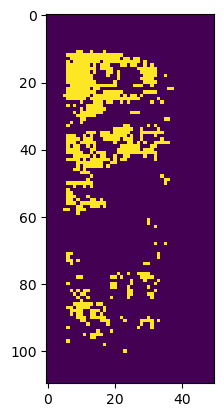

539


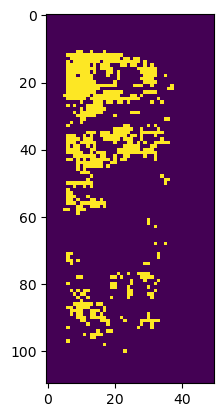

540


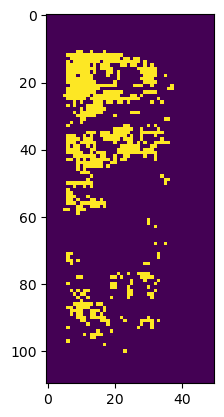

In [97]:
imshow(cluster_thres[1].reshape(50,110).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[1][i]==1:
        print(i)
        imshow(maps_thres[i].reshape(50,110).T)
        plt.show()

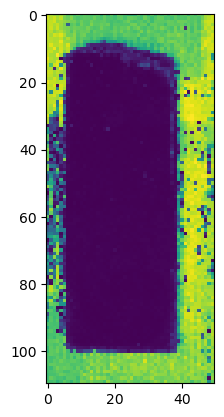

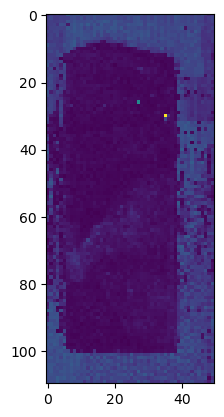

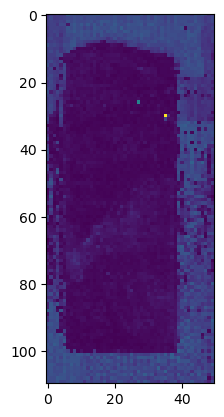

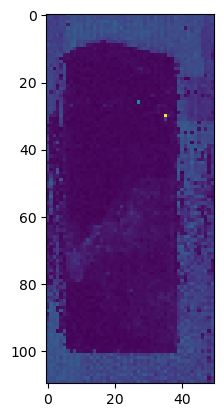

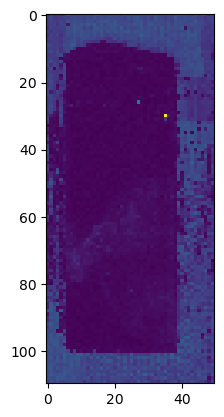

...

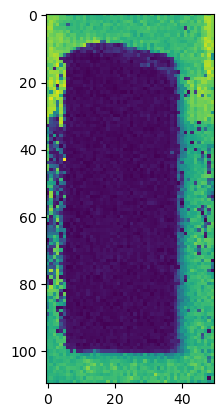

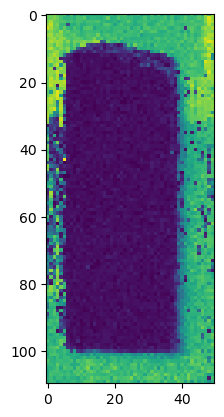

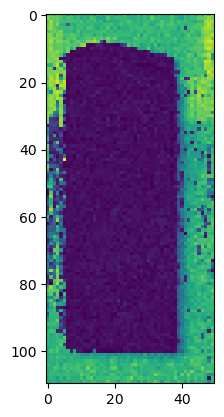

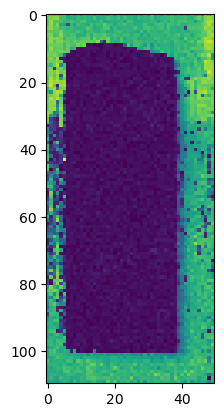

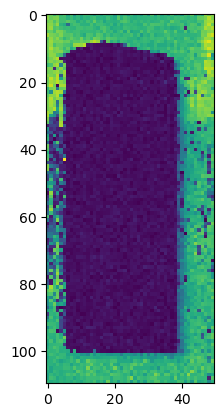

In [98]:
imshow(clusters_c[2].reshape(50,110).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[2][i]==1:
        imshow(new_maps_cut[i].reshape(50,110).T)
        plt.show()

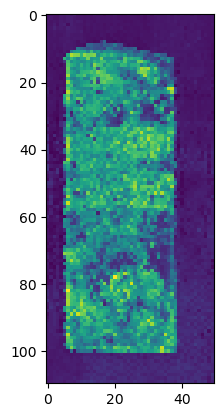

In [99]:
imshow(clusters_c[3].reshape(50,110).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[3][i]==1:
        imshow(new_maps_cut[i].reshape(50,110).T)
        plt.show()

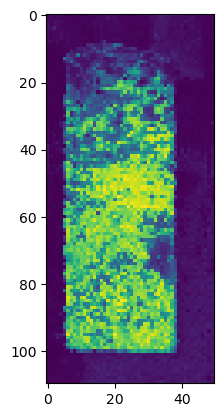

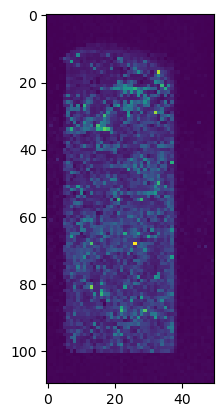

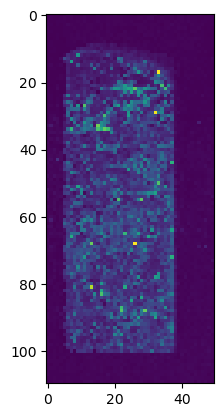

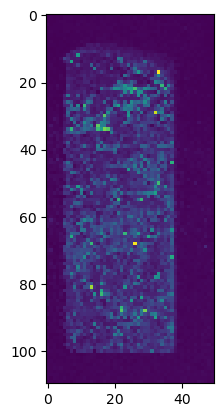

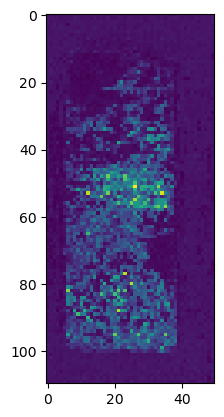

...

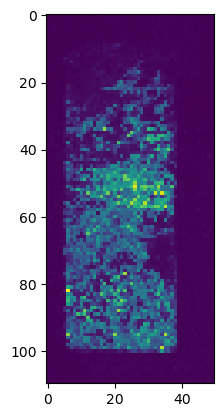

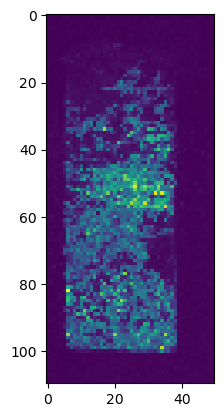

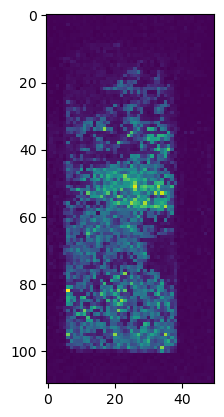

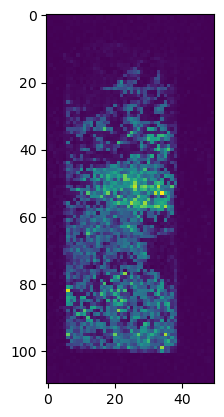

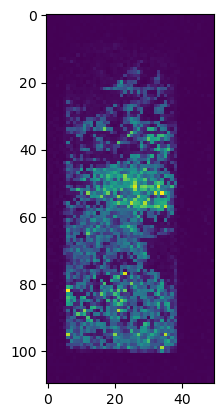

In [100]:
imshow(clusters_c[4].reshape(50,110).T)
plt.show()
for i in range(contain.shape[1]):
    if contain[4][i]==1:
        imshow(new_maps_cut[i].reshape(50,110).T)
        plt.show()

## clustering em mascaras

In [ ]:
from skimage.filters import threshold_minimum
import cv2
thresholds=np.array([threshold_minimum(new_maps_cut[i]) for i in range(new_maps_cut.shape[0])])

maps_thres=[]
for i in range(new_maps_cut.shape[0]):
    c_mask=np.zeros(new_maps_cut.shape[1])
    for j in range(new_maps_cut.shape[1]):
        if new_maps_cut[i][j]>thresholds[i]:
            c_mask[j]=1
    maps_thres.append(c_mask)
maps_thres=np.array(maps_thres)  

In [ ]:
maps_thres.shape

In [ ]:
kmeans = sklearn.cluster.KMeans(n_clusters = 6,random_state=0)
a=kmeans.fit_predict(maps_thres)
labels = kmeans.labels_
fig, ax = subplots(2, 3, figsize = (10, 8))
# clusters_c = np.array(kmeans.cluster_centers_.cpu())
clusters_c = np.array(kmeans.cluster_centers_)

j = 0
l = 0

for i in range(len(np.unique(labels))):
    axs = ax[l, j]
    # axs.imshow(clusters_c[i].reshape(pro_data.shape[:2]).T, interpolation = 'none')
    axs.imshow(clusters_c[i].reshape(pro_data.shape[0], pro_data.shape[1]), interpolation = 'none')
    axs.set_ylabel('y (mm)')
    axs.set_xlabel('x (mm)')
    axs.grid(False)
    j += 1
    if j == 3:
        j = 0
        l += 1

fig.tight_layout()
